# Import library

In [1]:
import rasterio
import torchgeo
import torch
import torch.nn as nn
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
from torchgeo.datasets import RasterDataset, VectorDataset
from torchgeo.samplers import GridGeoSampler
from pyproj import CRS
# import pycuda.driver as cuda

# Set seed to make it reproducible

In [2]:
# Set seeds for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

# Import data

## Sentinel-2 image

In [3]:
# sentinel2_path = '../data/raw/sentinel-2/sentinel2_openeo_med_4months_dresden.geotiff'
sentinel2_path = '../data/processed/sentinel-2/stacked_sentinel2_dresden.geotiff'
data = rioxarray.open_rasterio(sentinel2_path)

In [4]:
data.band

<xarray.DataArray 'band' (band: 18)> Size: 144B
array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18])
Coordinates:
  * band         (band) int64 144B 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18
    spatial_ref  int64 8B 0

In [5]:
data.sel(band=1).dtype

dtype('float32')

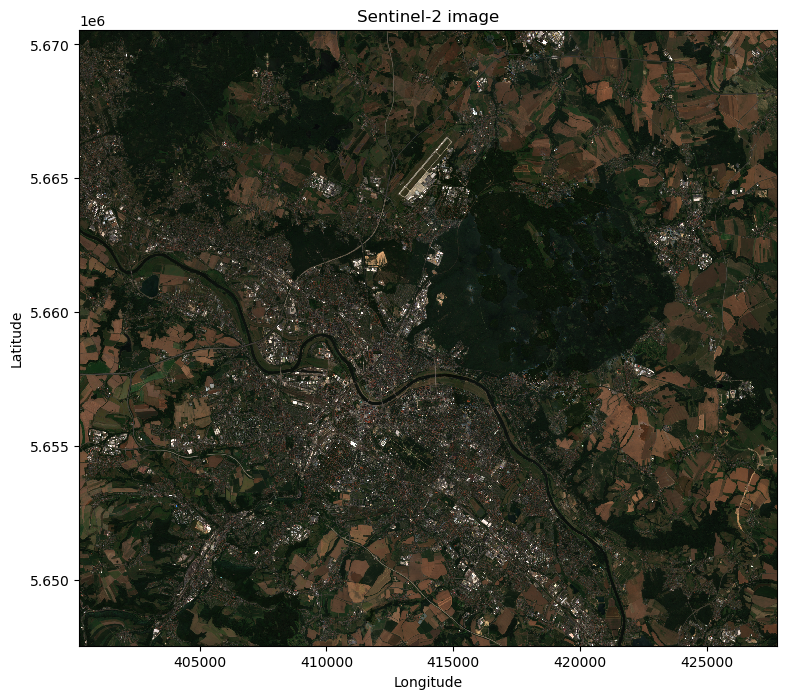

In [6]:
# Plot the raster data
plt.figure(figsize=(9,8))
# normalize(data).sel(band=[4, 3, 2]).plot.imshow()

# contrast_stretch_new(data).sel(band=[4, 3, 2]).plot.imshow()

# no need to do contrast stretch since data is already normalized
data.sel(band=[4, 3, 2]).plot.imshow()

plt.title("Sentinel-2 image")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Create image patches (Torchgeo)

## Create ROI for training, validation, and test set

manually specify

width: 27470.0 height: 23010.0
tile width: 5494.0 tile height: 4602.0
Tile 1 saved to ../data/processed/tiles/test/tile_1.geotiff
Tile 2 saved to ../data/processed/tiles/val/tile_2.geotiff
Tile 3 saved to ../data/processed/tiles/train/tile_3.geotiff
Tile 4 saved to ../data/processed/tiles/test/tile_4.geotiff
Tile 5 saved to ../data/processed/tiles/val/tile_5.geotiff
Tile 6 saved to ../data/processed/tiles/train/tile_6.geotiff
Tile 7 saved to ../data/processed/tiles/train/tile_7.geotiff
Tile 8 saved to ../data/processed/tiles/train/tile_8.geotiff
Tile 9 saved to ../data/processed/tiles/val/tile_9.geotiff
Tile 10 saved to ../data/processed/tiles/test/tile_10.geotiff
Tile 11 saved to ../data/processed/tiles/train/tile_11.geotiff
Tile 12 saved to ../data/processed/tiles/train/tile_12.geotiff
Tile 13 saved to ../data/processed/tiles/train/tile_13.geotiff
Tile 14 saved to ../data/processed/tiles/test/tile_14.geotiff
Tile 15 saved to ../data/processed/tiles/train/tile_15.geotiff
Tile 16 saved

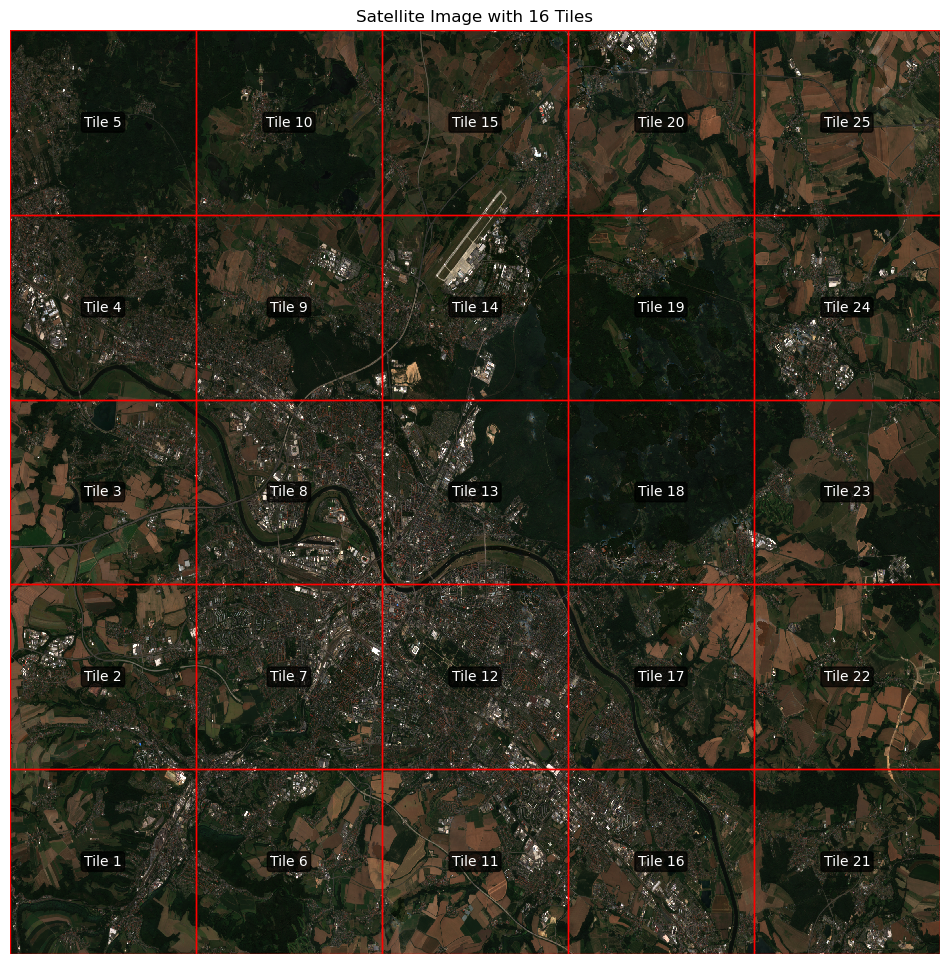

In [7]:
# Create a folder for saving the tiles
folder_path = '../data/processed/tiles'
os.makedirs(folder_path, exist_ok=True)

# Open the raster data
rds = rioxarray.open_rasterio(sentinel2_path)

# Get the bounds of the image
xmin, ymin, xmax, ymax = rds.rio.bounds()

# Calculate the width and height of each tile
print("width:", xmax - xmin, "height:", ymax - ymin)
base_tile_width = (xmax - xmin) // 5
base_tile_height = (ymax - ymin) // 5
print("tile width:", base_tile_width, "tile height:", base_tile_height)

# train, validation, test index list
train_index_list = [3, 6, 7, 8, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 25]
val_index_list = [2, 9, 5, 21, 24]
test_index_list = [1, 4, 10, 14, 17]

# Create 25 tiles (5x5 grid) with special handling for the last column/row
tiles = []
for i in range(5):
    for j in range(5):
        # For columns 0-3, use regular spacing
        tile_xmin = xmin + i * base_tile_width
        
        # For the last column, extend to the edge
        if i == 4:
            tile_xmax = xmax
        else:
            tile_xmax = xmin + (i + 1) * base_tile_width
        
        # For the last row, extend to the edge
        tile_ymin = ymin + j * base_tile_height
        if j == 4:
            tile_ymax = ymax
        else:
            tile_ymax = ymin + (j + 1) * base_tile_height
        
        tiles.append([tile_xmin, tile_xmax, tile_ymin, tile_ymax])

# Plot the original satellite image with bounding boxes for the 16 tiles
plt.figure(figsize=(12, 12))
data.sel(band=[4, 3, 2]).plot.imshow()
plt.axis('off')

# Add bounding boxes for each tile
ax = plt.gca()
for idx, tile in enumerate(tiles):
    tile_xmin, tile_xmax, tile_ymin, tile_ymax = tile
    width = tile_xmax - tile_xmin
    height = tile_ymax - tile_ymin
    
    # Create a rectangle patch
    rect = patches.Rectangle((tile_xmin, tile_ymin), width, height, 
                             linewidth=1, edgecolor='r', facecolor='none')
    
    # Add the rectangle to the plot
    ax.add_patch(rect)
    
    # Add text label for the tile number
    plt.text(tile_xmin + width/2, tile_ymin + height/2, f'Tile {idx+1}', 
             ha='center', va='center', color='white', fontsize=10,
             bbox=dict(facecolor='black', alpha=0.7, boxstyle='round,pad=0.2'))

    # Clip the raster to this tile and save it
    if (idx+1) in train_index_list:
        subfolder_path = os.path.join(folder_path, 'train')
        os.makedirs(subfolder_path, exist_ok=True)
    elif (idx+1) in val_index_list:
        subfolder_path = os.path.join(folder_path, 'val')
        os.makedirs(subfolder_path, exist_ok=True)
    else:
        subfolder_path = os.path.join(folder_path, 'test')
        os.makedirs(subfolder_path, exist_ok=True)

    tile_rds = rds.rio.clip_box(minx=tile_xmin, miny=tile_ymin, maxx=tile_xmax, maxy=tile_ymax)
    tile_file_path = os.path.join(subfolder_path, f'tile_{idx + 1}.geotiff')
    tile_rds.rio.to_raster(tile_file_path, driver='GTiff')
    print(f"Tile {idx + 1} saved to {tile_file_path}")

plt.title('Satellite Image with 16 Tiles')
plt.show()

---

# Define functions for creating patches

In [8]:
import warnings

warnings.filterwarnings(
    "ignore", 
    message="You will likely lose important projection information when converting to a PROJ string from another format.*", 
    category=UserWarning
)

warnings.filterwarnings(
    "ignore",
    message="Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired.*",
    category=UserWarning
)

In [9]:
# # 1th percentile to 99th percentile
# # Apply a percentile-based contrast stretch (ignore the extreme values so image isn't too dark or too bright)
# def contrast_stretch_patch(array, lower_percentile=1, upper_percentile=99):
#     min_value = array.min().item()
#     # valid_area = np.ones_like(array[0], dtype=bool)
#     # for band in range(array.shape[0]):
#     #     valid_area = valid_area & (array[band] != min_value)

#     img_area = (array!=min_value) # create a mask of valid area

#     array_new = np.where(array == min_value, np.nan, array) # replace min_value
#     lower = np.percentile(array_new[img_area], lower_percentile)
#     upper = np.percentile(array_new[img_area], upper_percentile)
#     # print('lower: ', lower)
#     # print('upper: ', upper)
#     array = np.clip(array_new, lower, upper) # clip -> limit the values in an array to specific range
#     result = (array - lower) / (upper - lower) # normalization
#     result[~img_area] = 0
#     result = torch.from_numpy(result)
    
#     return result, img_area

In [10]:
def process_mask(mask, valid_area):
    mask = mask.numpy()
    valid_area = valid_area.numpy()
    mask[~valid_area[0]] = 0
    result = torch.from_numpy(mask)
    return result

# Start create patches

In [11]:
from torch.utils.data import DataLoader

# Set seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)

In [12]:
# Define paths for pre-split tiles
train_image_path = '../data/processed/tiles/train'
val_image_path = '../data/processed/tiles/val'
test_image_path = '../data/processed/tiles/test'

In [13]:
# Vector data path
# label_path = '../data/processed/osm/public_green_spaces_dresden.geojson'
label_path = '../data/processed/ground truth/dresden_pugs_gt.geojson'

In [14]:
# Create a custom filtering function
def filter_patches(sample):
    """Filter patches that contain only background or only PUGS"""
    mask = sample['mask'].numpy()
    # Calculate percentage of green space in the mask
    green_percentage = np.mean(mask)
    
    # Keep patches that have between 5% and 95% green space
    return 0.05 < green_percentage < 0.95

In [15]:
from torchgeo.transforms import AugmentationSequential, indices
import torch
from torchvision import transforms as T
import kornia.augmentation as K

# Create augmentation sequence
# p parameter is the probability of applying the transformation
transform_test = AugmentationSequential(
    # Standard spatial augmentations
    K.RandomHorizontalFlip(p=0.6),
    K.RandomVerticalFlip(p=0.6),
    K.RandomRotation(degrees=45, p=0.5, align_corners=True),
    # Define which keys and indices to apply transformations to
    data_keys=['image', 'mask']
)

In [16]:
# # Custom dataset class that applies filtering
# class FilteredGeoDataset:
#     # stride is set as 64 for both x and y directions
#     def __init__(self, dataset, patch_size=256, stride=64, transform=None):
#         self.dataset = dataset
#         self.sampler = GridGeoSampler(dataset, size=(patch_size, patch_size), stride=stride)
#         self.transform = transform
#         self.bounds = dataset.bounds
        
#         # Compute the valid patches
#         self.valid_bboxes = []
#         for bbox in self.sampler:
#             sample = self.dataset[bbox]
#             if filter_patches(sample):
#                 self.valid_bboxes.append(bbox)
#                 # print("in")
#         print(f"Found {len(self.valid_bboxes)} valid patches out of {len(self.sampler)} total patches")
    
#     def __len__(self):
#         return len(self.valid_bboxes)
    
#     def __getitem__(self, idx):
#         sample = self.dataset[self.valid_bboxes[idx]]
        
#         # Apply normalization
#         sample['image'], valid_area = contrast_stretch_patch(sample['image'])
#         sample['mask'] = process_mask(sample['mask'], valid_area)
#         # print(sample['image'].shape)
#         # print(sample['mask'].shape)
#         # print(sample.keys())
#         # Apply transform for augmentation
#         if self.transform is not None:
#             sample = self.transform(sample)
#             print("image shape after augmentation:", sample['image'].shape)
#             print("mask shape after augmentation:", sample['image'].shape)
#             sample['image'] = sample['image'].squeeze(0)
#             sample['mask'] = sample['mask'].squeeze(0)
        
#         del sample["crs"]
#         del sample["bounds"]

#         return sample

In [17]:
from torch.utils.data import Dataset

# Custom dataset class that applies filtering
class FilteredGeoDataset(Dataset):
    # stride is set as 64 for both x and y directions
    def __init__(self, dataset, patch_size=256, stride=64, transform=None, specific_bands=list(range(13))):
        self.dataset = dataset
        self.sampler = GridGeoSampler(dataset, size=(patch_size, patch_size), stride=stride)
        self.transform = transform
        self.bounds = dataset.bounds
        self.specific_bands = specific_bands
        
        # Compute the valid patches
        self.valid_bboxes = []
        for bbox in self.sampler:
            sample = self.dataset[bbox]
            if filter_patches(sample):
                self.valid_bboxes.append(bbox)
                # print("in")
        print(f"Found {len(self.valid_bboxes)} valid patches out of {len(self.sampler)} total patches")
    
    def __len__(self):
        return len(self.valid_bboxes)
    
    def __getitem__(self, idx):
        sample = self.dataset[self.valid_bboxes[idx]]

        # Select specific bands    
        sample['image'] = sample['image'][self.specific_bands]
    
        min_value = sample['image'].min().item()
        valid_area = (sample['image']!=min_value) # create a mask of valid area

        # sample['image'], valid_area = contrast_stretch_patch(sample['image'])
        sample['mask'] = process_mask(sample['mask'], valid_area)
        
        
        del sample["crs"]
        del sample["bounds"]

        return sample

In [18]:
class AugmentedDataset(Dataset):
    """Dataset wrapper that applies multiple augmentations to increase sample count"""
    def __init__(self, dataset, transform=None, num_augmentations=2):
        self.dataset = dataset
        self.transform = transform
        self.num_augmentations = num_augmentations
    
    def __len__(self):
        return len(self.dataset) * (self.num_augmentations + 1)  # Original + augmented versions
    
    def __getitem__(self, idx):
        # Calculate original dataset index and augmentation version
        dataset_idx = idx // (self.num_augmentations + 1)
        aug_version = idx % (self.num_augmentations + 1)
        
        # Get original sample
        sample = self.dataset[dataset_idx]
        
        # If it's the first version (aug_version=0), return original
        if aug_version == 0 or self.transform is None:
            return sample
        
        # Apply transformation
        # Make a deep copy to avoid modifying the original
        import copy
        sample_copy = copy.deepcopy(sample)
        
        # Apply the transformation
        sample_copy = self.transform(sample_copy)

        # Ensure proper shape (remove batch dimension added by some transforms)
        sample_copy['image'] = sample_copy['image'].squeeze(0)
        sample_copy['mask'] = sample_copy['mask'].squeeze(0)
            
        return sample_copy

In [19]:
band_lists = [1,2,3,4,5,6,7,8,9,10,11,12,14]

In [20]:
# Create datasets for each split
def create_dataset_split(image_path, label_path, dataset_type):
    image_ds = RasterDataset(paths=image_path, crs=CRS.from_epsg(32633), res=10)
    label_ds = VectorDataset(paths=label_path, crs=CRS.from_epsg(32633), res=10)
    combined_ds = image_ds & label_ds
    # filter_ds = FilteredGeoDataset(dataset=combined_ds, stride=64, specific_bands=list(range(1, 14)))
    # filter_ds = FilteredGeoDataset(dataset=combined_ds, stride=64, specific_bands=list(range(14)))
    filter_ds = FilteredGeoDataset(dataset=combined_ds, stride=64, specific_bands=list(range(13)))
    # filter_ds = FilteredGeoDataset(dataset=combined_ds, stride=64, specific_bands=band_lists)
    if dataset_type == 'train':
        return AugmentedDataset(dataset=filter_ds, transform=transform_test)
    else:
        return filter_ds

In [21]:
# Create the filtered datasets
train_dataset = create_dataset_split(train_image_path, label_path, 'train')

Found 345 valid patches out of 450 total patches


In [22]:
print(len(train_dataset))

1035


In [23]:
val_dataset = create_dataset_split(val_image_path, label_path, 'validation')
test_dataset = create_dataset_split(test_image_path, label_path, 'test')

Found 146 valid patches out of 150 total patches
Found 142 valid patches out of 150 total patches


In [24]:
from torchgeo.datasets.utils import stack_samples

In [25]:
# Create DataLoaders
batch_size = 16

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    collate_fn=stack_samples
)

In [26]:
len(train_loader)

65

In [27]:
val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

In [28]:
# # Visualize some training samples
# for i, sample in enumerate(train_dataset):
#     arr = sample['image'].numpy()
#     mask = sample['mask'].numpy()

#     # Print the shape of the image array
#     print(f"Sample {i} - Image shape: {arr.shape}, Mask shape: {mask.shape}")
#     print(f"Green space percentage: {np.mean(mask):.2f}")

#     # Transpose the array to get the correct shape for RGB (height, width, channels)
#     rgb = arr.transpose(1, 2, 0)[:, :, [3, 2, 1]]

#     # Create a figure with two subplots
#     fig, axes = plt.subplots(1, 2, figsize=(12, 6))

#     # Display the RGB image in the first subplot
#     axes[0].imshow(rgb)
#     axes[0].set_title('RGB Image')
#     axes[0].axis('off')

#     # Display the mask in the second subplot
#     axes[1].imshow(mask, cmap='gray')
#     axes[1].set_title('Mask')
#     axes[1].axis('off')

#     # Show the figure
#     plt.show()
    
#     if i >= 4:  # Show only 5 samples
#         break

Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.71


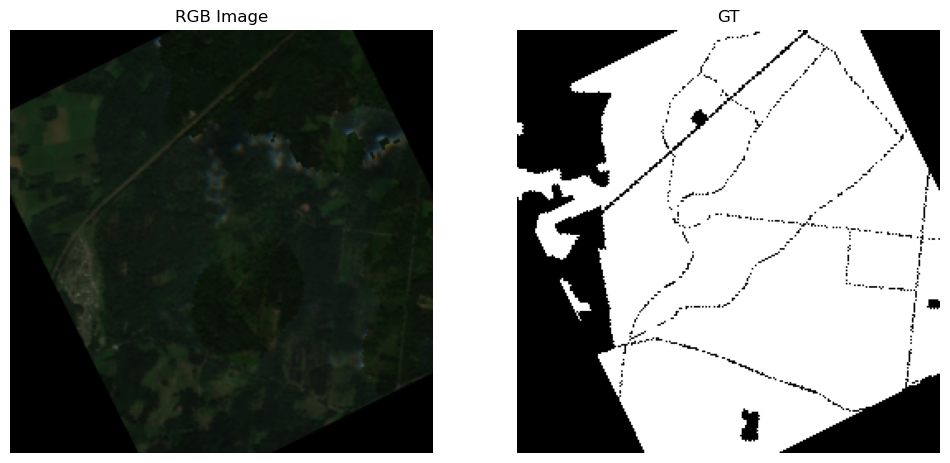

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.06


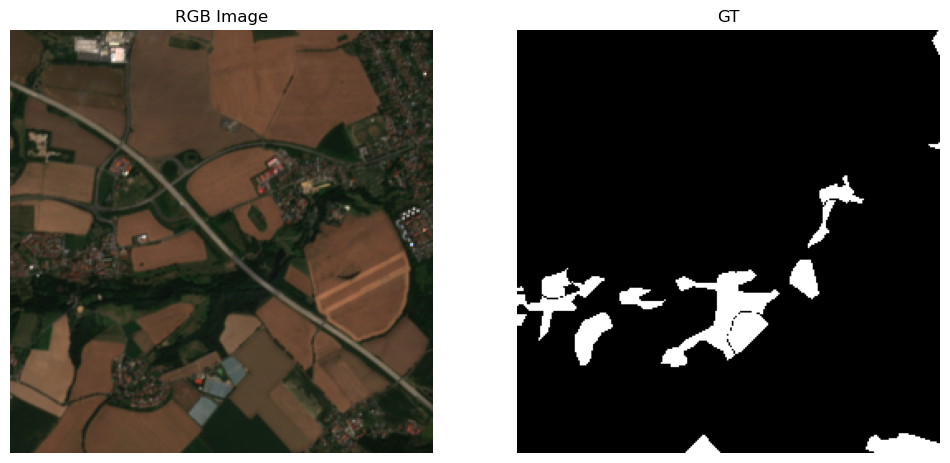

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


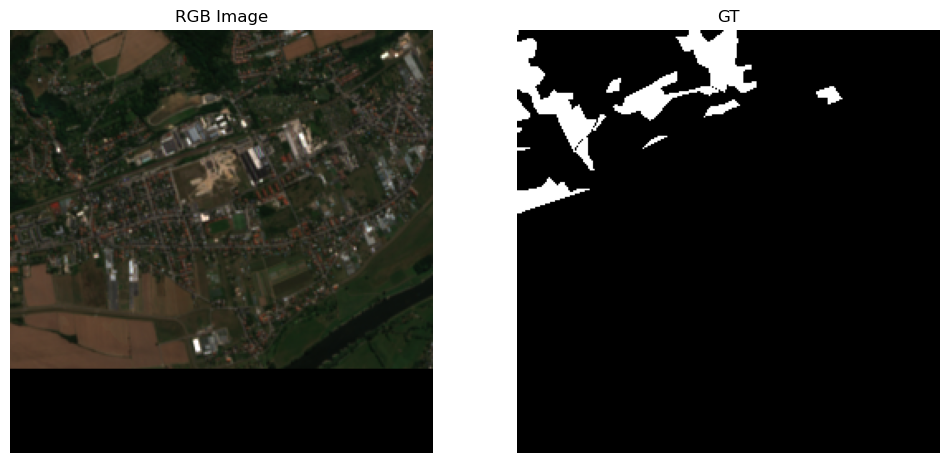

Sample 3:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.10


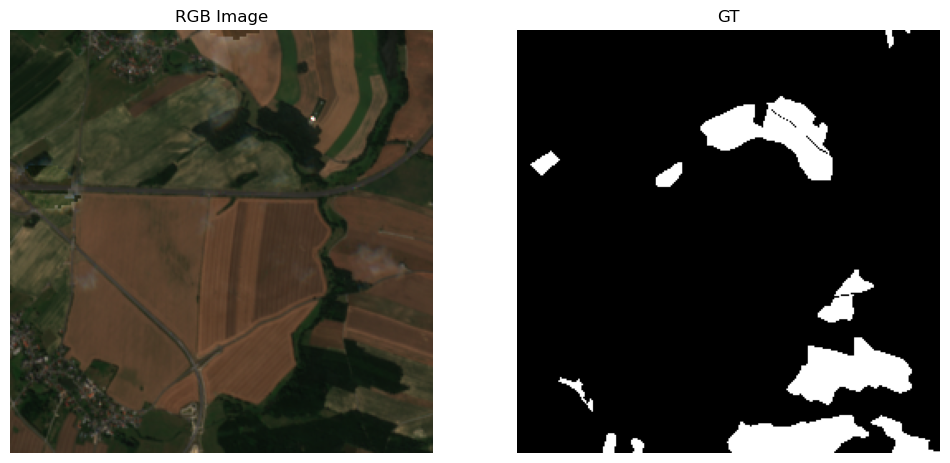

Sample 4:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.06


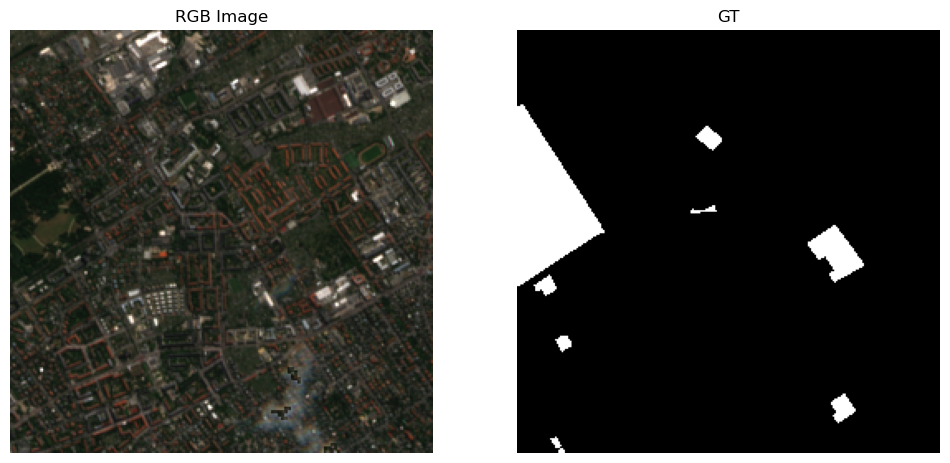

In [30]:
def visualize_from_torchgeo_dataloader(dataloader, num_samples=3):
    """Visualize samples from a TorchGeo DataLoader with stack_samples"""
    torch.manual_seed(seed)
    # Get a batch from the dataloader
    dataiter = iter(dataloader)
    batch = next(dataiter)
    # print(batch.keys())
    # augment_batch = transform_test(batch)
    # print(augment_batch.keys())

    # range(min(num_samples, augment_batch['image'].shape[0]))
    for i in range(min(num_samples, batch['image'].shape[0])):
        # Get the image and mask for this sample
        image = batch['image'][i]
        mask = batch['mask'][i]
        
        # Convert to numpy for visualization
        image_np = image.numpy()
        mask_np = mask.numpy()
        
        # image_osm_mask = image_np[12]
        # image_sdt_mask = image_np[12]
        # image_osm_mask = image_np[13]

        # Print information about the sample
        print(f"Sample {i}:")
        print(f"  Image shape: {image_np.shape}")
        print(f"  Mask shape: {mask_np.shape}")
        print(f"  Green space percentage: {np.mean(mask_np):.2f}")
        
        # For sentinel-2 data, use bands 4,3,2 (R,G,B) or 8,4,3 (NIR,R,G)
        # Assuming bands are [C, H, W]
        if image_np.shape[0] > 3:  # Multi-spectral image
            rgb = image_np[[3, 2, 1], :, :].transpose(1, 2, 0)  # Select 4,3,2 bands (RGB bands)
            # rgb = image_np[[2, 1, 0], :, :].transpose(1, 2, 0)  # Select 4,3,2 bands (RGB bands)
        else:
            rgb = image_np.transpose(1, 2, 0)
        
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        # fig, axes = plt.subplots(1, 3, figsize=(12, 6))
        
        # Display the RGB image in the first subplot
        axes[0].imshow(rgb)
        axes[0].set_title('RGB Image')
        axes[0].axis('off')
        
        # Display the mask in the second subplot
        # axes[1].imshow(image_osm_mask, cmap='gray')
        # axes[1].set_title('OSM Mask')
        # axes[1].axis('off')
        # axes[1].imshow(image_sdt_mask, cmap='gray')
        # axes[1].set_title('SDT')
        # axes[1].axis('off')

        # Display the mask in the second subplot
        # axes[2].imshow(mask_np, cmap='gray')
        # axes[2].set_title('GT')
        # axes[2].axis('off')
        
        axes[1].imshow(mask_np, cmap='gray')
        axes[1].set_title('GT')
        axes[1].axis('off')
        
        plt.show()

visualize_from_torchgeo_dataloader(train_loader, num_samples=5)

Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.10


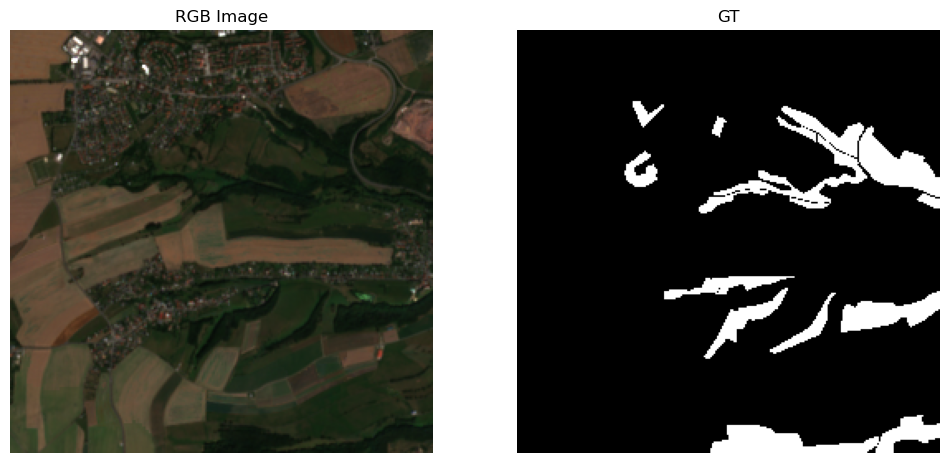

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.14


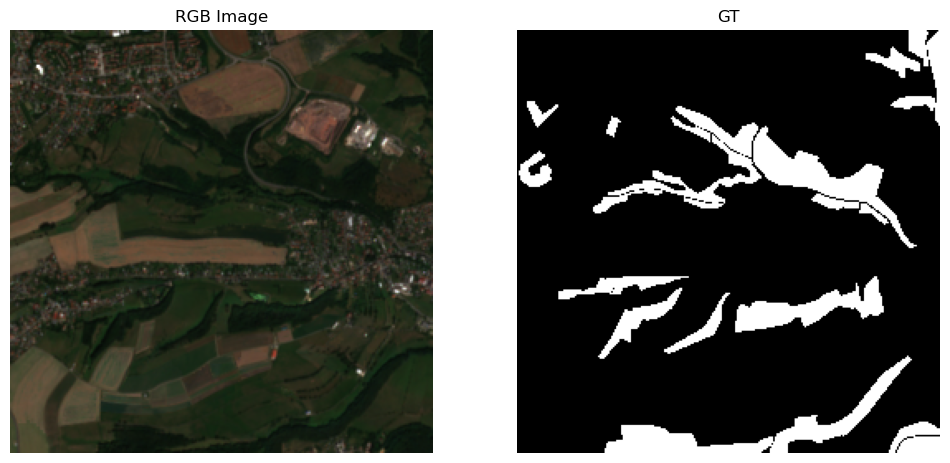

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.16


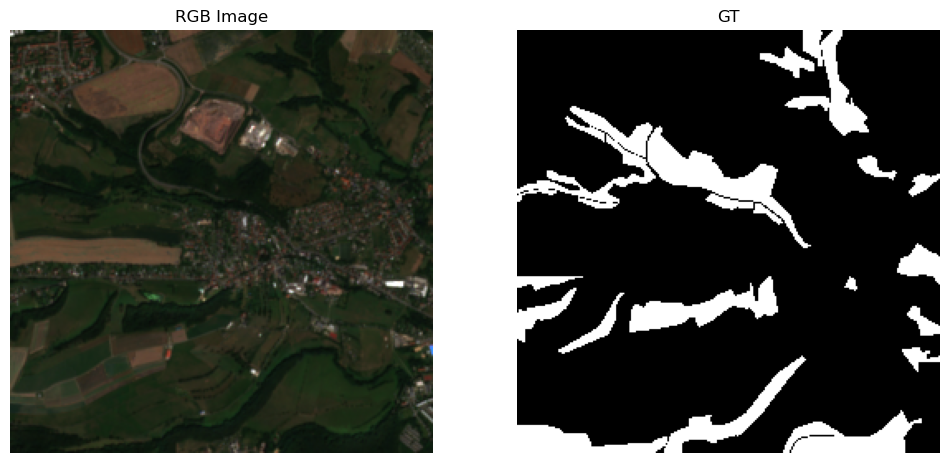

In [31]:
visualize_from_torchgeo_dataloader(val_loader, num_samples=3)

Sample 0:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.37


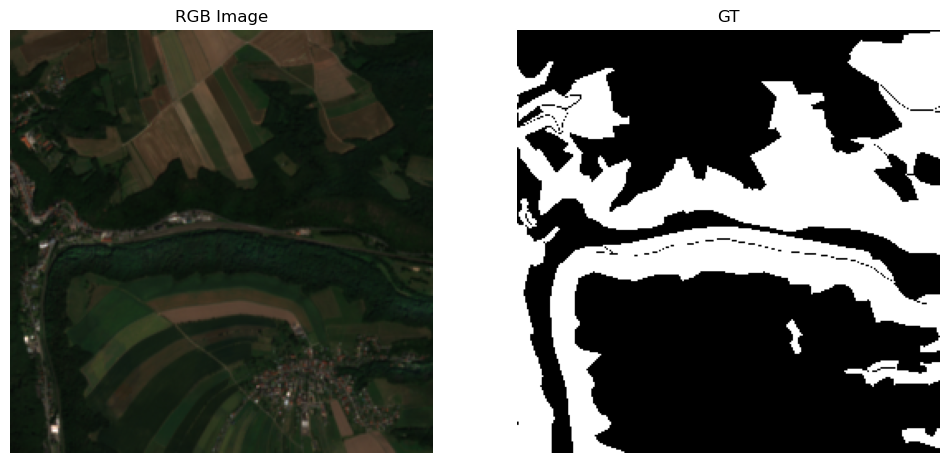

Sample 1:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.39


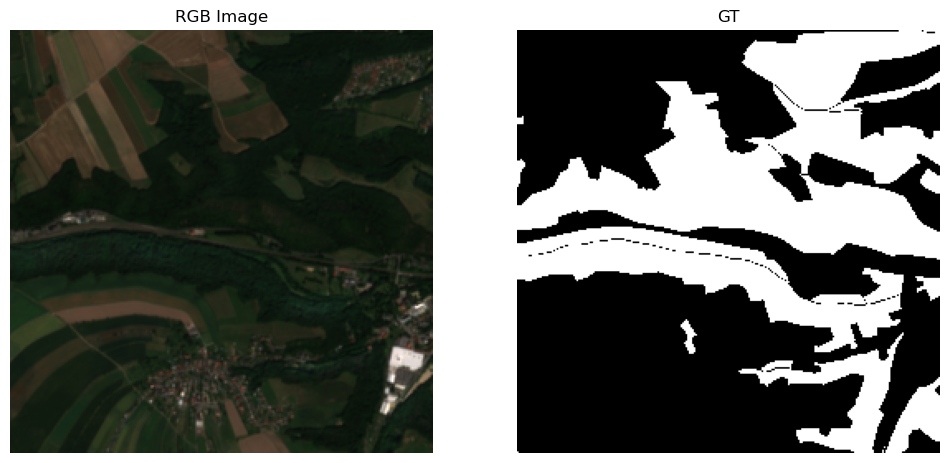

Sample 2:
  Image shape: (13, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.40


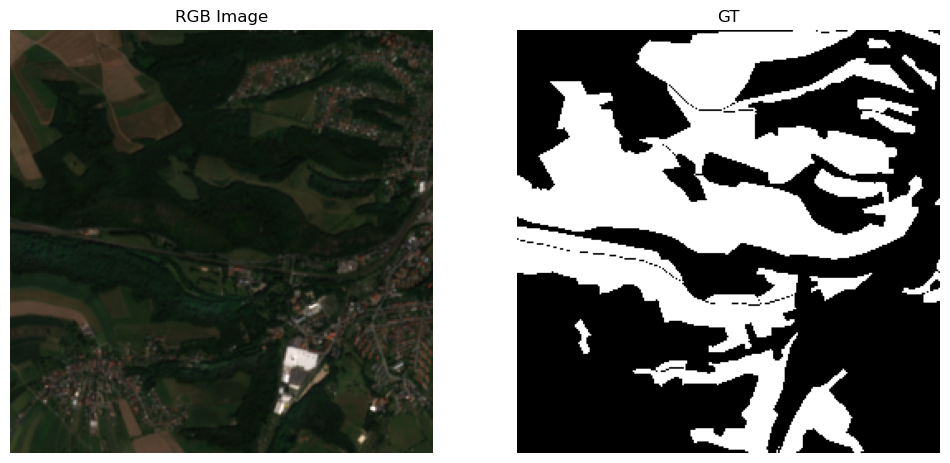

In [32]:
visualize_from_torchgeo_dataloader(test_loader, num_samples=3)

## Check the patches that doesn't fit perfectly with image boundary

In [33]:
def visualize_boundary_patches(dataset):
    bounds = dataset.bounds
    
    for bbox in dataset.sampler:
        # Check if bbox extends beyond dataset boundaries
        is_boundary_patch = (
            bbox.minx < bounds.minx or
            bbox.miny < bounds.miny or
            bbox.maxx > bounds.maxx or
            bbox.maxy > bounds.maxy
        )
        
        if is_boundary_patch:
            try:
                sample = dataset.dataset[bbox]
                
                # Apply normalization
                image, valid_area = contrast_stretch_patch(sample['image'])
                image = image.numpy()
                mask = process_mask(sample['mask'], valid_area)
                mask = mask.numpy()
                
                # Create visualization
                fig, axes = plt.subplots(1, 2, figsize=(10, 6))
                
                # For RGB visualization
                rgb = image[[3, 2, 1], :, :].transpose(1, 2, 0)
                axes[0].imshow(rgb)
                axes[0].set_title('Boundary Patch - Image')
                axes[0].axis('off')
                
                axes[1].imshow(mask, cmap='gray')
                axes[1].set_title('Boundary Patch - Mask')
                axes[1].axis('off')
                
                plt.suptitle(f"Boundary Patch at {bbox}")
                plt.tight_layout()
                plt.show()

                if input("Show next? (y/n): ") != 'y':
                    break
                    
            except Exception as e:
                print(f"Error processing boundary bbox {bbox}: {e}")

lower:  4.0
upper:  3828.0


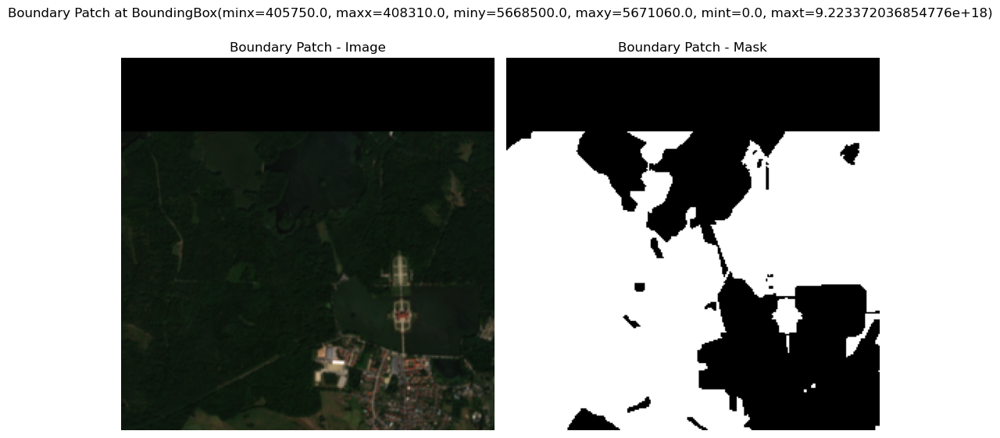

In [62]:
visualize_boundary_patches(test_dataset)

# Create custom GeoDataModule

In [95]:
from torchgeo.datamodules import GeoDataModule

In [96]:
class PugsGeoDataModule(GeoDataModule):
    def setup(self, stage: str) -> None:
        # Create datasets for each split
        self.train_dataset = create_dataset_split(train_image_path, label_path, 'train')
        self.val_dataset = create_dataset_split(val_image_path, label_path, 'validation')
        self.test_dataset = create_dataset_split(test_image_path, label_path, 'test')
        
        if stage in ["fit"]:
            self.train_batch_sampler = GridGeoSampler(
                self.train_dataset, self.patch_size, self.batch_size, self.length
            )
        if stage in ["fit", "validate"]:
            self.val_sampler = GridGeoSampler(
                self.val_dataset, self.patch_size, self.patch_size
            )
        if stage in ["test"]:
            self.test_sampler = GridGeoSampler(
                self.test_dataset, self.patch_size, self.patch_size
            )

In [99]:
from torchgeo.datasets import GeoDataset

datamodule = PugsGeoDataModule(
    dataset_class = GeoDataset, # GeoDataModule kwargs
    batch_size = 8, # GeoDataModule kwargs
    patch_size = 256, # GeoDataModule kwargs
    length = 100, # GeoDataModule kwargs
    num_workers = 2 # GeoDataModule kwargs
)

# Test creating model

In [33]:
from lightning.pytorch import Trainer, seed_everything

from torchgeo.models import ResNet50_Weights
from torchgeo.trainers import SemanticSegmentationTask

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [34]:
seed_everything(42, workers=True)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


42

In [35]:
# batch_size = 10
# num_workers = 2
# max_epochs = 10
# fast_dev_run = False

In [36]:
weight_test = ResNet50_Weights.SENTINEL2_ALL_MOCO

## Modified model

13 channels + OSM binary mask

In [ ]:
def modify_first_layer(task, in_channels=14):    
    # Get the model from the task
    model = task.model
    
    # Find the first conv layer (can delete first if -> hasattr(model, 'backbone'))
    if hasattr(model, 'backbone') and hasattr(model.backbone, 'conv1'):
        # ResNet-based UNet
        first_conv = model.backbone.conv1
    elif hasattr(model, 'encoder') and hasattr(model.encoder, 'conv1'):
        # Some other architecture
        first_conv = model.encoder.conv1
    else:
        # If structure is different, try to find the first conv
        for module in model.modules():
            if isinstance(module, nn.Conv2d) and module.in_channels == 13:
                first_conv = module
                break
    
    # Store the original weights
    original_weights = first_conv.weight.data
    
    # Create a new conv with more input channels
    new_conv = nn.Conv2d(
        in_channels=in_channels,
        out_channels=first_conv.out_channels,
        kernel_size=first_conv.kernel_size,
        stride=first_conv.stride,
        padding=first_conv.padding,
        bias=first_conv.bias is not None
    )
    
    # Copy the original weights for the first 13 channels
    with torch.no_grad():
        new_conv.weight[:, :13] = original_weights
        # Initialize the new channel(s) with small random values
        if in_channels > 13:
            nn.init.kaiming_normal_(new_conv.weight[:, 13:])
    
    # Replace the original conv with the new one
    if hasattr(model, 'backbone') and hasattr(model.backbone, 'conv1'):
        model.backbone.conv1 = new_conv
    elif hasattr(model, 'encoder') and hasattr(model.encoder, 'conv1'):
        model.encoder.conv1 = new_conv
    else:
        # If we found it through modules() earlier
        raise ValueError("Could not replace the first convolutional layer")
    
    print(task)
    
    return task

In [50]:
# Use the custom task
task = SemanticSegmentationTask(
    weights=weight_test,
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    num_classes=2,
    in_channels=13,
    lr=0.01,
    patience=5,
)
task = modify_first_layer(task, in_channels=14)

SemanticSegmentationTask(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(14, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (

## Original model

In [37]:
task = SemanticSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    weights=weight_test,
    in_channels=13,
    num_classes=2,
    lr=0.01,
    patience=5,
)

## Training

In [38]:
trainer = Trainer(max_epochs=15, deterministic=True)

trainer.fit(model=task, train_dataloaders=train_loader, val_dataloaders=val_loader)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
INFO: 
  | Name          | Type             | Params | Mode 
----------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 14: 100%|██████████| 65/65 [16:50<00:00,  0.06it/s, v_num=13]

INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 65/65 [16:51<00:00,  0.06it/s, v_num=13]


In [39]:
trainer.test(model=task, dataloaders=test_loader)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 9/9 [01:17<00:00,  0.12it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.9100649356842041
test_MulticlassJaccardIndex    0.8349716663360596
         test_loss             0.20042787492275238
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.20042787492275238,
  'test_MulticlassAccuracy': 0.9100649356842041,
  'test_MulticlassJaccardIndex': 0.8349716663360596}]

In [40]:
def visualize_predictions(model, test_loader, num_batches=5, samples_per_batch=4):
    # Set model to evaluation mode
    model.eval()
    
    # Iterate through batches
    for batch_idx, batch in enumerate(test_loader):
        if batch_idx >= num_batches:
            break
        
        # Get data
        images = batch["image"]
        masks = batch["mask"]
        
        # Generate predictions
        with torch.no_grad():
            logits = model(images)
            # Ensure predictions have the right shape
            preds = torch.sigmoid(logits)
            preds = (preds > 0.5).float()
            
            # Print shapes for debugging
            print(f"Prediction shape: {preds.shape}")
            print(f"Mask shape: {masks.shape}")
        
        # Create visualization
        num_samples = min(samples_per_batch, images.shape[0])
        # fig, axes = plt.subplots(num_samples, 4, figsize=(15, 5*num_samples))
        fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

        if num_samples == 1:
            axes = axes.reshape(1, 3)
        
        for i in range(num_samples):
            # Get sample
            img = images[i].cpu().numpy()
            mask = masks[i].cpu().numpy()
            pred = preds[i].cpu().numpy()
            
            print(f"Sample {i} - Image shape: {img.shape}, Mask shape: {mask.shape}, Pred shape: {pred.shape}")
            
            # Create RGB visualization for the image
            if img.shape[0] >= 13:
                # Sentinel-2 RGB composite
                rgb = np.stack([img[3], img[2], img[1]], axis=0)
                # rgb = np.stack([img[2], img[1], img[0]], axis=0)
                rgb = np.transpose(rgb, (1, 2, 0))
                rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-7)
            elif img.shape[0] == 3:
                # Standard RGB
                rgb = np.transpose(img, (1, 2, 0))
                rgb = np.clip(rgb, 0, 1)
            elif img.shape[0] == 2:
                # For 2-channel data, use first channel as grayscale
                rgb = img[0]
            else:
                # Grayscale
                rgb = img[0]
            
            # Ensure mask is 2D for plotting
            if mask.ndim > 2:
                if mask.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    mask = mask.squeeze(0)
                else:
                    # Multiple channels, take the first one
                    mask = mask[0]
            
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
                    print(np.max(pred))
            
            # Plot
            axes[i, 0].imshow(rgb)
            axes[i, 0].set_title("Image")
            axes[i, 0].axis("off")
            
            # axes[i, 1].imshow(img[13], cmap="gray")
            # axes[i, 1].set_title("OSM mask")
            # axes[i, 1].axis("off")

            # axes[i, 2].imshow(mask, cmap="gray")
            # axes[i, 2].set_title("Ground Truth")
            # axes[i, 2].axis("off")

            axes[i, 1].imshow(mask, cmap="gray")
            axes[i, 1].set_title("Ground Truth")
            axes[i, 1].axis("off")
            
            try:
                # axes[i, 3].imshow(pred, cmap="gray")
                # axes[i, 3].set_title("Prediction")
                # axes[i, 3].axis("off")
                axes[i, 2].imshow(pred, cmap="gray")
                axes[i, 2].set_title("Prediction")
                axes[i, 2].axis("off")
            except Exception as e:
                print(f"Error plotting prediction: {e}")
                print(f"Prediction shape: {pred.shape}, dtype: {pred.dtype}")
                # Try alternate approach
                if pred.ndim > 2:
                    pred_2d = pred.mean(axis=0)  # Average across channels
                    axes[i, 2].imshow(pred_2d, cmap="gray")
                else:
                    # Create a blank image
                    blank = np.zeros_like(mask)
                    axes[i, 2].imshow(blank, cmap="gray")
                axes[i, 2].set_title("Prediction (Error)")
                axes[i, 2].axis("off")
        
        plt.tight_layout()
        plt.show()

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


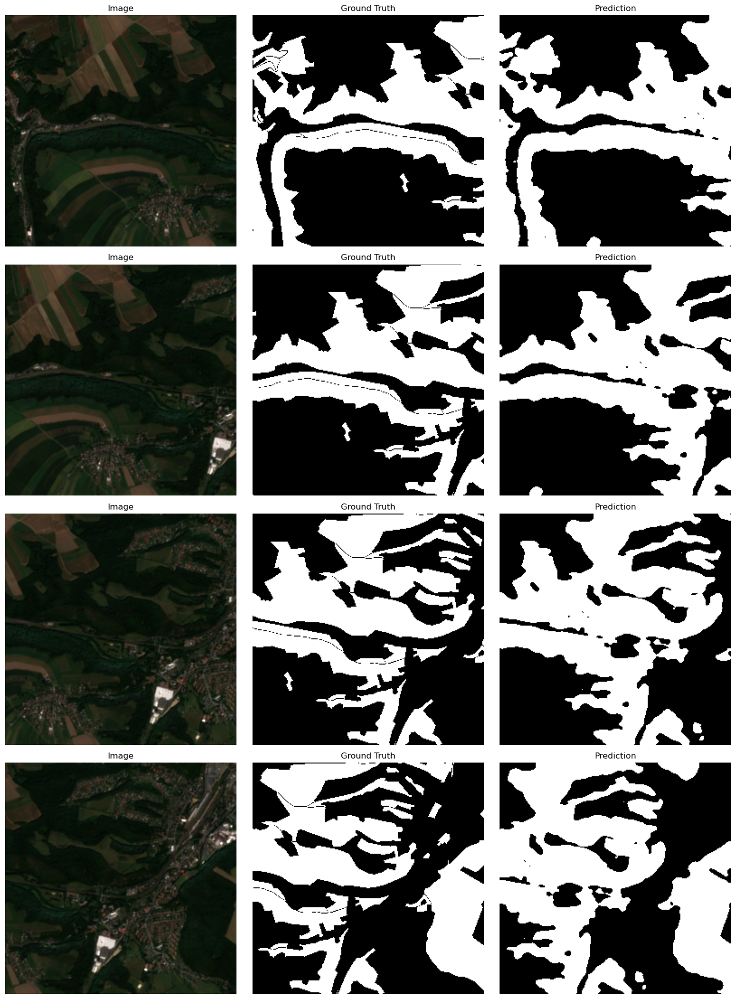

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


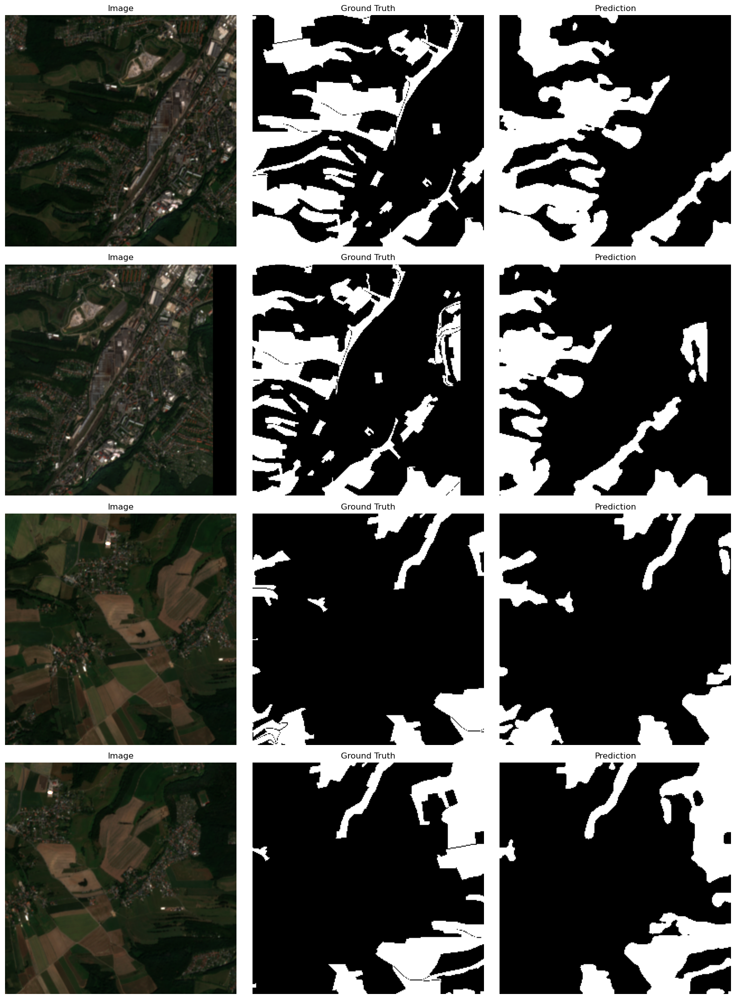

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


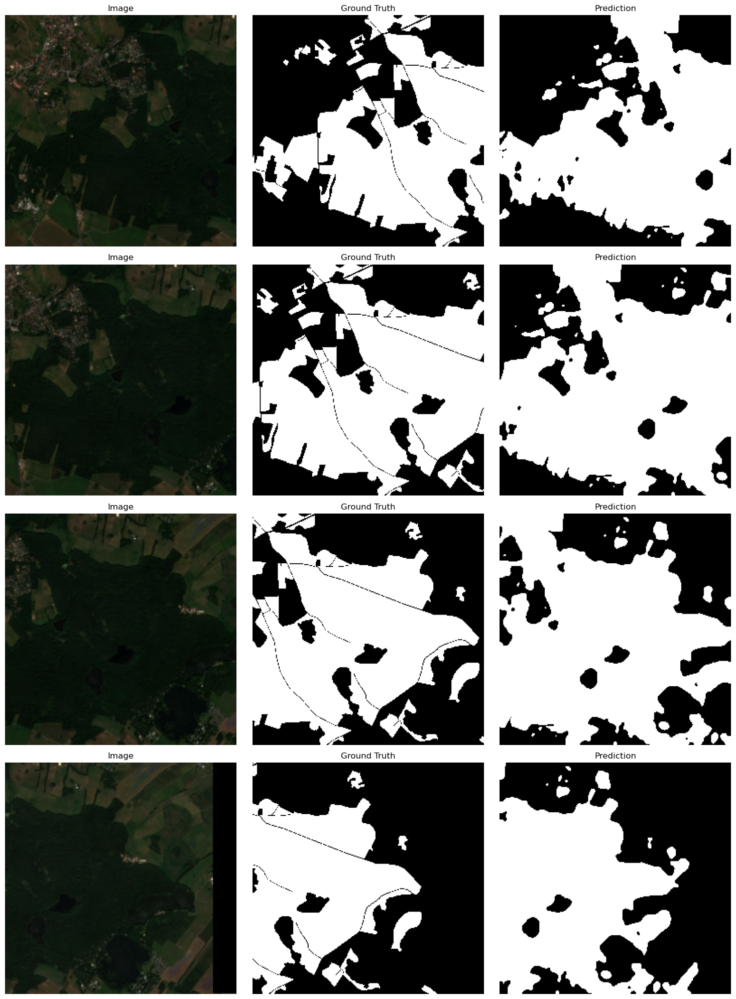

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


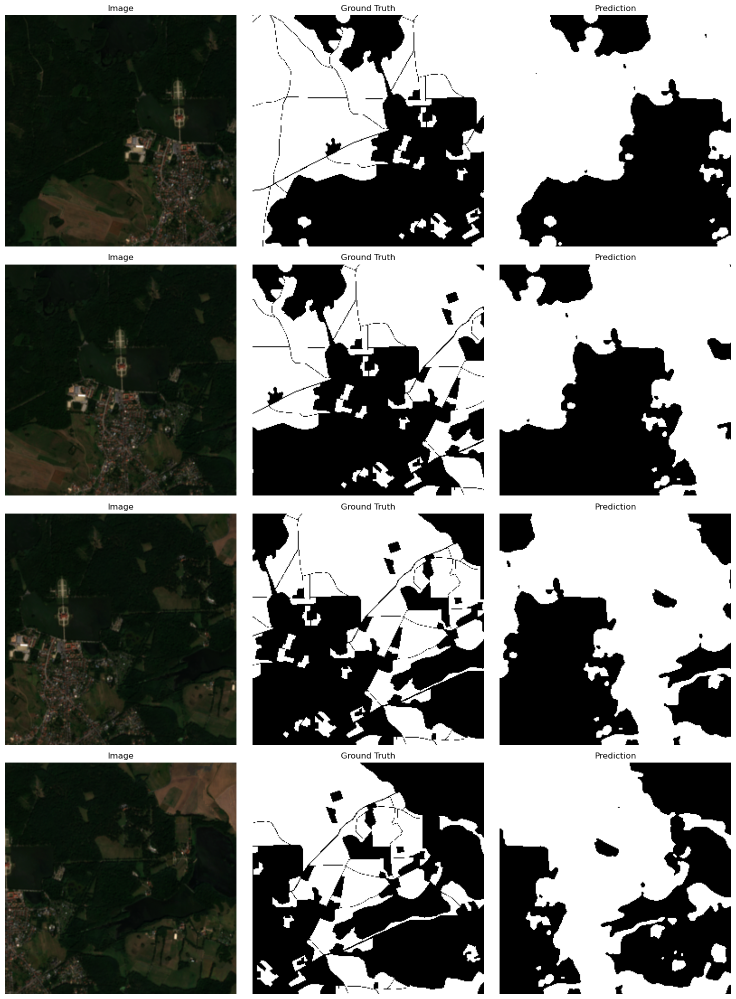

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (13, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


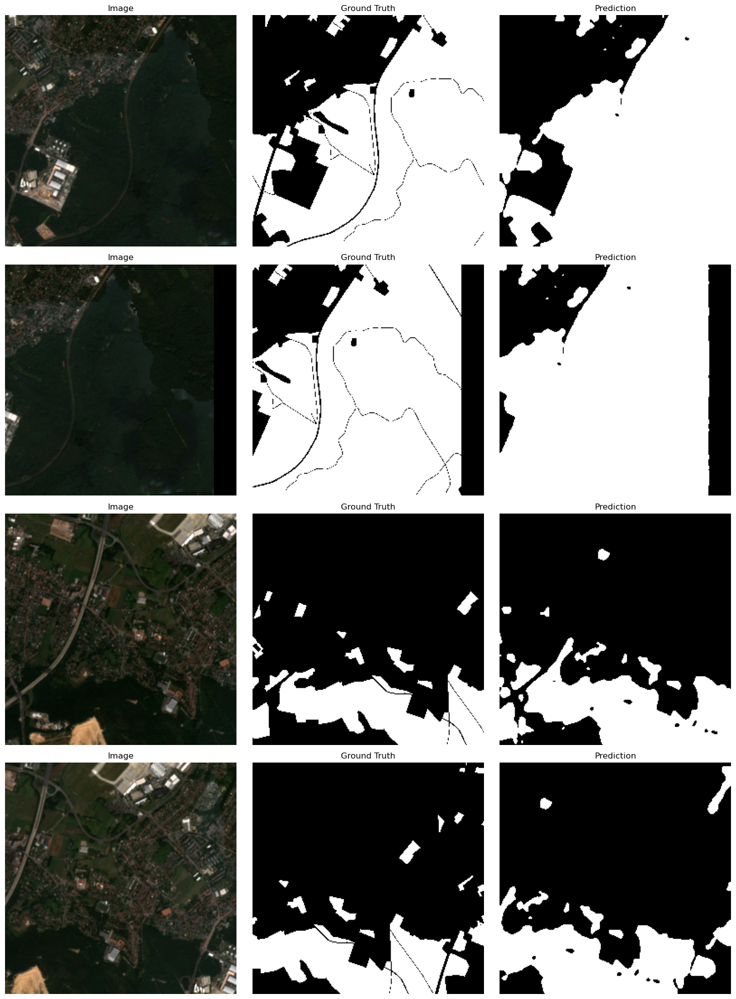

In [41]:
visualize_predictions(task, test_loader)